# Исследование рынка общественного питания в г. Москва


## Описание проекта

Необходимо исследовать текущий рынок общественного питания в г. Москва, с целью дальнейшего принятия решения об открытии собственного заведения<br>
Для этого предоставлены открытые данные о заведениях общественного питания в г. Москва<br>
Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:<br>
«Средний счёт: 1000–1500 ₽»;<br>
«Цена чашки капучино: 130–220 ₽»;<br>
«Цена бокала пива: 400–600 ₽».<br>
и так далее;<br>
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:<br>
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.<br>
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.<br>
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.<br>
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:<br>
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.<br>
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.<br>
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.<br>
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):<br>
0 — заведение не является сетевым<br>
1 — заведение является сетевым<br>
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.


**Цель проекта**

Исследовать текущие тенденции и определить успешный вариант инвестирования в сферу общественного питания

## Обзор данных

In [1]:
import pandas as pd 
import numpy as np
import datetime as dt
import seaborn as sns
pd.set_option('display.max_columns', 0)
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_colwidth', -1)

In [2]:
data=pd.read_csv('E:/moscow_places.csv')


In [3]:
# Зададим функции, необходимые для обзора данных
# функция для сведения о столбцах
def describe_cols(df_data):
    df = df_data
    values = pd.DataFrame()
    
    for col in df.columns:
        values[col] = [df[col].unique(), df[col].dtypes, df[col].nunique()]
        
    return values.transpose().sort_values(by=1, ascending=True).rename(
        {0: 'Значения', 1: 'тип данных', 2: 'Кол-во уникальных значений'}, axis=1)


#функция для вывода пустых значений и их доли
def nan_values(df_data):
    df = df_data
    count_missing = df.isna().sum()
    percent_missing = round(df.isna().sum() * 100 / len(df), 2)
    
    missing_value_df = pd.DataFrame({'column_name': df.columns,
                                     'num_missing': count_missing,
                                     'percent_missing': percent_missing})
    
    return missing_value_df


#функция для вывода общей информации о файле
def df_info (df_data):
    print('Количество строк файла:', len(df_data))
    print()
    print('Информация о содержимом файла:')
    display(describe_cols(df_data))
    print()
    print('Информация о пропусках данных:')
    display(nan_values(df_data))
    print()
    print('Первые пять строк таблицы:')
    display(df_data.head())



In [4]:
df_info(data)

Количество строк файла: 8406

Информация о содержимом файла:


,Значения,тип данных,Кол-во уникальных значений
chain,"[0, 1]",int64,2
lat,"[55.878494, 55.875801, 55.889146, 55.881608, 55.881166, 55.88801, 55.890752, 55.890636, 55.880045, 55.879038, 55.877832, 55.88177, 55.899938, 55.877007, 55.885528, 55.88589, 55.877859, 55.876908, 55.884651, 55.887969, 55.880287, 55.876805, 55.883414, 55.888421, 55.879992, 55.878453, 55.87939, 55.879324, 55.893061, 55.898414, 55.879723, 55.878691, 55.877388, 55.89003, 55.886963, 55.876278, 55.882222, 55.888023, 55.888366, 55.880831, 55.895115, 55.878515, 55.88001, 55.928943, 55.876289, 55.885837, 55.879934, 55.880306, 55.878511, 55.88616, 55.878339, 55.878014, 55.878531, 55.880622, 55.887978, 55.880288, 55.896323, 55.900316, 55.906281, 55.899845, 55.898085, 55.902557, 55.898081, 55.900058, 55.898061, 55.887887, 55.883112, 55.890415, 55.897679, 55.888623, 55.901799, 55.891196, 55.906875, 55.889243, 55.881626, 55.889759, 55.888705, 55.909009, 55.92039, 55.885986, 55.897789, 55.883422, 55.889872, 55.896987, 55.891779, 55.883265, 55.888065, 55.908484, 55.879256, 55.884775, 55.891932, 55.901597, 55.878926, 55.905994, 55.893672, 55.888942, 55.879733, 55.897603, 55.883574, 55.882019, ...]",float64,8209
lng,"[37.47886, 37.484479, 37.525901, 37.48886, 37.449357, 37.509573, 37.524653, 37.524303, 37.539006, 37.524487, 37.469171, 37.492362, 37.517958, 37.50498, 37.528371, 37.493264, 37.507754, 37.449876, 37.517482, 37.515688, 37.448646, 37.464934, 37.514572, 37.527106, 37.481571, 37.460028, 37.541228, 37.48028, 37.501319, 37.539256, 37.510227, 37.478993, 37.523334, 37.537515, 37.523518, 37.505575, 37.518057, 37.515443, 37.514856, 37.510574, 37.524902, 37.479308, 37.520204, 37.540548, 37.519315, 37.513422, 37.492522, 37.48976, 37.479158, 37.508784, 37.483154, 37.522867, 37.479395, 37.448529, 37.515823, 37.448645, 37.51596, 37.540918, 37.570558, 37.576517, 37.570488, 37.565872, 37.586001, 37.571696, 37.570544, 37.57346, 37.588294, 37.558867, 37.581229, 37.591366, 37.588011, 37.577672, 37.585653, 37.582493, 37.594633, 37.545617, 37.53045, 37.555713, 37.558619, 37.553977, 37.602098, 37.588189, 37.558293, 37.591299, 37.608126, 37.552636, 37.604737, 37.589321, 37.538404, 37.538444, 37.605419, 37.573445, 37.547348, 37.542381, 37.576284, 37.558562, 37.595195, 37.593734, 37.604949, 37.558299, ...]",float64,8258
rating,"[5.0, 4.5, 4.6, 4.4, 4.7, 4.8, 4.3, 4.9, 4.2, 4.1, 4.0, 3.8, 3.9, 3.7, 3.6, 2.8, 2.7, 3.1, 1.5, 2.0, 1.4, 3.3, 3.5, 3.2, 2.9, 3.0, 3.4, 2.3, 2.2, 2.5, 2.6, 1.7, 1.0, 1.1, 2.4, 1.3, 1.2, 2.1, 1.8, 1.9, 1.6]",float64,41
middle_avg_bill,"[nan, 1550.0, 1000.0, 500.0, 199.0, 250.0, 1100.0, 330.0, 1500.0, 400.0, 245.0, 425.0, 900.0, 240.0, 225.0, 328.0, 300.0, 345.0, 230.0, 650.0, 750.0, 1250.0, 1750.0, 2250.0, 600.0, 450.0, 850.0, 2100.0, 349.0, 200.0, 120.0, 269.0, 1300.0, 1150.0, 355.0, 275.0, 1200.0, 575.0, 350.0, 700.0, 284.0, 150.0, 362.0, 325.0, 2000.0, 291.0, 280.0, 2750.0, 1400.0, 2500.0, 2150.0, 5000.0, 825.0, 625.0, 3250.0, 675.0, 475.0, 1690.0, 925.0, 1050.0, 340.0, 950.0, 1025.0, 321.0, 550.0, 360.0, 375.0, 317.0, 324.0, 343.0, 140.0, 165.0, 215.0, 549.0, 175.0, 313.0, 1375.0, 100.0, 975.0, 11000.0, 800.0, 295.0, 3750.0, 1350.0, 430.0, 130.0, 525.0, 344.0, 185.0, 1800.0, 875.0, 480.0, 695.0, 261.0, 1450.0, 3000.0, 180.0, 404.0, 235.0, 366.0, ...]",float64,230
middle_coffee_cup,"[nan, 170.0, 145.0, 150.0, 180.0, 120.0, 100.0, 256.0, 160.0, 250.0, 165.0, 149.0, 135.0, 220.0, 175.0, 195.0, 60.0, 214.0, 75.0, 89.0, 95.0, 204.0, 90.0, 140.0, 125.0, 162.0, 155.0, 154.0, 297.0, 205.0, 124.0, 200.0, 190.0, 134.0, 139.0, 287.0, 225.0, 230.0, 237.0, 290.0, 254.0, 279.0, 174.0, 179.0, 295.0, 245.0, 105.0, 285.0, 270.0, 84.0, 127.0, 80.0, 112.0, 185.0, 210.0, 325.0, 159.0, 215.0, 110.0, 266.0, 242.0, 137.0, 255.0, 240.0, 217.0, 315.0, 130.0, 167.0, 169.0, 235.0, 1568.0, 79.0, 260.0, 300.0, 291.0, 275.0, 115.0, 328.0, 94.0, 265.0, 184.0, 229.0, 164.0, 172.0, 259.0, 246.0, 199.0, 138.0, 375.0, 189.0, 320.0, 197.0, 227.0, 102.0, 119.0, 144.0, 129.0]",float64,96
seats


Информация о пропусках данных:


,column_name,num_missing,percent_missing
name,name,0,0.00
category,category,0,0.00
address,address,0,0.00
district,district,0,0.00
hours,hours,536,6.38
lat,lat,0,0.00
lng,lng,0,0.00
rating,rating,0,0.00
price,price,5091,60.56
avg_bill,avg_bill,4590,54.60



Первые пять строк таблицы:


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


### Вывод

В представленных для исследования сведениях содержится 8406 строк обозначающих  заведения общественного питания.<br>
Имеются пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats, при чем пропусков большое количество, однако их удаление или заполнение средними/медианными значениями может привести к искажению данных, в виду чего решено оставить пропуски.
Также необходимо проверить данные на наличие явных дубликатов.

## Предобработка данных

In [5]:
#Проверим наличие явных дубликатов
data.duplicated().sum()

0

Дубликаты отсутствуют

In [6]:
#Создадим столбец с названием улицы отдельно от столбца с адресом
data['street'] = data['address'].str.split(', ').str[1]

In [7]:
#Создадим столбец is_24\7 для обозначения круглосуточных заведений, которые работают ежедневно.
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

### Вывод


В ходе предобработки данных осуществлены следующие действия:<br>
- Исследовано наличие явных дубликатов, дубликаты отсутствуют
- Добавлен столбец с названием улицы отдельно от столбца с адресом
- Добавлен столбец is_24\7 для обозначения круглосуточных заведений, которые работают ежедневно.


## Исследование и анализ

### Анализ количества объектов общественного питания по категориям

In [8]:
# Посчитаем количество объектов по категориям и визуализируем их
group_category= data.groupby(['category']).agg({'category':'count'}).rename(columns={'category':'category_count'}).sort_values(by='category',ascending=False).reset_index()
display(group_category)
layout=go.Layout(title='Соотношение различных типов объектов общественного питания')
fig=go.Figure(data=[go.Pie(labels=group_category['category'],values=group_category['category_count'])],layout=layout)
fig.show()

,category,category_count
0,столовая,315
1,ресторан,2043
2,пиццерия,633
3,кофейня,1413
4,кафе,2378
5,быстрое питание,603
6,булочная,256
7,"бар,паб",765


Наибольшую долю среди предприятий общественного питания в Москве имеют заведения типа "Кафе"- 28,3% или 2378 в количественном выражении, второе место "Ресторан" с показателем 24.3% или 2043

### Исследование количества посадочных мест в заведениях по категориям

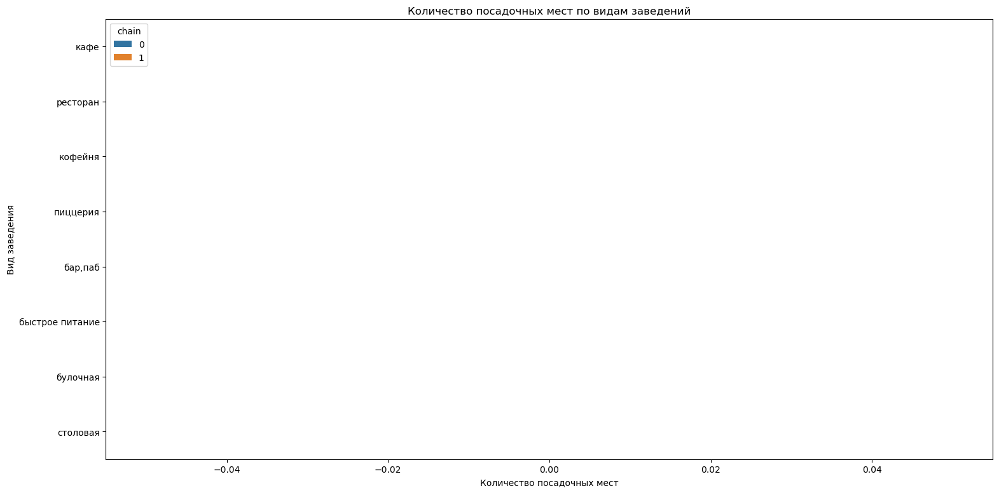

In [9]:
plt.figure(figsize=(18,9))
ax=sns.barplot(y='category',x='seats',data=data,estimator=np.median,hue='chain')
ax.set_xlabel('Количество посадочных мест')
ax.set_ylabel('Вид заведения')
ax.set_title('Количество посадочных мест по видам заведений')
plt.show()

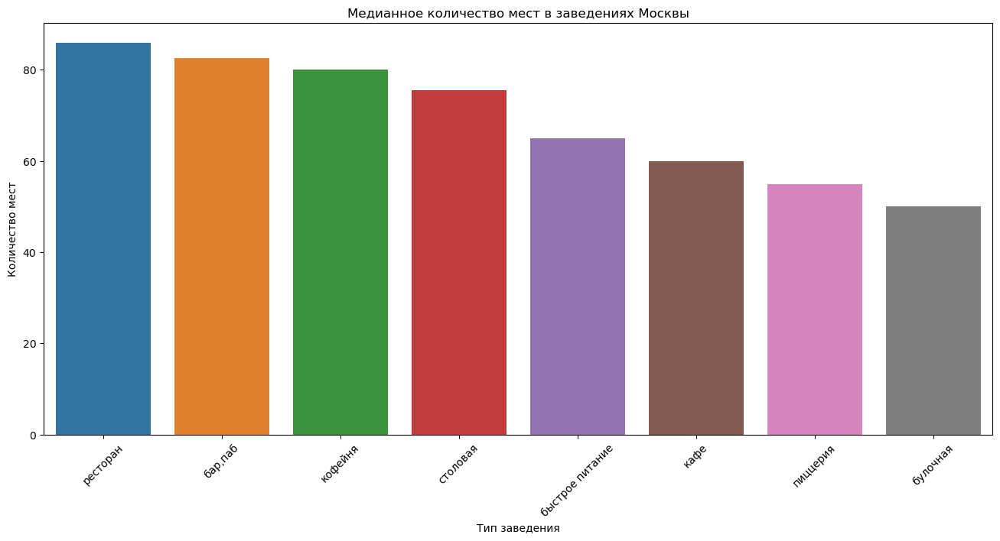

In [10]:
seats_median = data.groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False).round(2)

f, ax = plt.subplots(figsize=(16, 7))

ax = sns.barplot(data=seats_median, x='category', y='seats')

ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество мест')
ax.set_title('Медианное количество мест в заведениях Москвы')
plt.xticks(rotation=45)
plt.show()

Практически во всех заведениях, за исключением категории бар,паб в сетевых заведениях посадочных мест больше, чем в несетевых.<br>
Без разделения на сетевые/несетевые заведения больше всего посадочных мест в Ресторанах - 82, барах, пабах - 81 и в кофейнях - 80<br>
В среднем, больше всего посадочных мест в сетевых заведениях в ресторанах - 98, в кофейнях - 90 и в столовых - 80.<br>
В несетевых заведениях больше всего посадочных мест в барах, пабах - 84, ресторанах, 80 и в столовых - 64.<br>

### Исследование соотношения сетевых и несетевых заведений 

In [11]:
# Посчитаем количество сетевых и несетвых объектов и визуализируем их
# для удобства заменим данные в столбце, содержащем сведения о сетевых данных на "сетевое" и "несетевое"
data['chain'] = data['chain'].map({0:'несетевое',1:'сетевое'})
chain_count=data.groupby(['chain']).agg({'chain':'count'}).rename(columns={'chain':'count'}).sort_values(by='count',ascending=False).reset_index()
display(chain_count)
layout=go.Layout(title='Доли сетевых и несетевых объектов общественного питания')
fig=go.Figure(data=[go.Pie(labels=chain_count['chain'],values=chain_count['count'])],layout=layout)
fig.show()

,chain,count
0,несетевое,5201
1,сетевое,3205


Большинство объектов общественного питания 61,9% или же 5201 не относятся к какой-либо сети. <br>
И всего 38,1% или же 3205 объектов являются сетевыми.

In [12]:
#Выявим объекты каких типов чаще всего являются сетевыми и не сетевыми
object_type_chain= (data.groupby([ 'category', 'chain'])
                    .agg({'category':'count'})
                    .rename(columns={'category':'category_count'})
                    .sort_values(by=['chain','category_count'], ascending=False)
                   )
object_type_chain.reset_index(inplace=True)




In [13]:
chain_objects = data.groupby(['category', 'chain'])['name'].count().reset_index()
chain_objects.columns = ['object_type', 'chain', 'count']
chain_objects['chain'] = chain_objects['chain'].astype(object)
chain_objects = chain_objects.sort_values(['count', 'chain'])
chain_objects

,object_type,chain,count
15,столовая,сетевое,88
2,булочная,несетевое,99
3,булочная,сетевое,157
1,"бар,паб",сетевое,169
14,столовая,несетевое,227
5,быстрое питание,сетевое,232
10,пиццерия,несетевое,303
11,пиццерия,сетевое,330
4,быстрое питание,несетевое,371
0,"бар,паб",несетевое,596


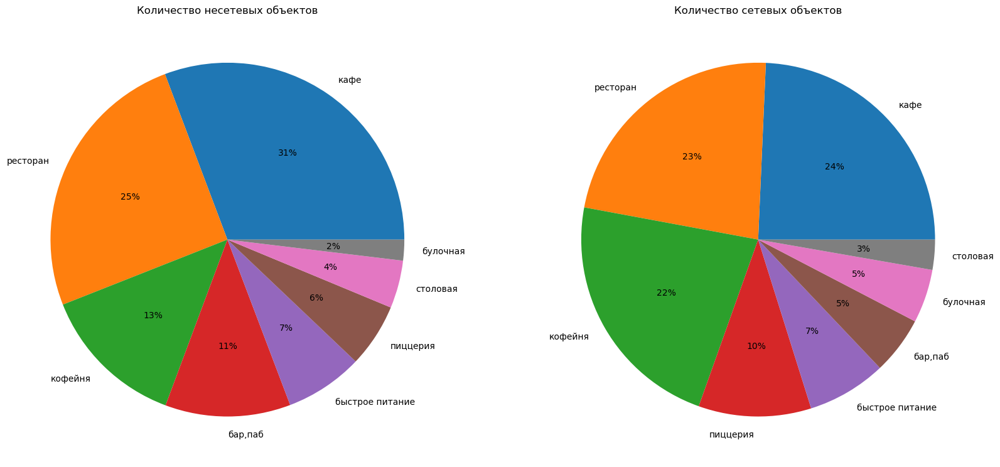

In [14]:
#Выявим объекты каких типов чаще всего являются сетевыми и не сетевыми

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
data_no_chain=object_type_chain.query('chain=="несетевое"')['category_count']
labels=object_type_chain.query('chain=="несетевое"')['category']
plt.pie(data_no_chain,labels=labels,autopct='%.0f%%')
plt.title('Количество несетевых объектов')

plt.subplot(1,2,2)
data_chain=object_type_chain.query('chain=="сетевое"')['category_count']
labels=object_type_chain.query('chain=="сетевое"')['category']
plt.pie(data_chain,labels=labels,autopct='%.0f%%')
plt.title('Количество сетевых объектов')
plt.show()

In [15]:
chain_grouped = data[data['chain'] == 'сетевое'].groupby(['category'])['name'].count()\
                                 .reset_index().sort_values(by='name', ascending=False)

notChain_grouped = data[data['chain'] == 'несетевое'].groupby(['category'])['name'].count()\
                                 .reset_index().sort_values(by='name', ascending=False)

# инициализация фигуры
fig = go.Figure()
# добавление барчарта методом Bar()
fig.add_trace(go.Bar(x=chain_grouped.category, y=chain_grouped.name,\
                     name='Сетевое', marker={'color': '#E69F00', 'opacity': 0.7}))
fig.add_trace(go.Bar(x=notChain_grouped.category, y=notChain_grouped.name,\
                     name='Несетевое', marker={'color': '#56B4E9', 'opacity': 0.7}))
# добавление соответствующих подписей и меток
fig.update_layout(title='Соотношение сетевых и несетевых заведений',\
                  xaxis_title='Категория', yaxis_title='Количество объектов', legend=dict(y=0.95, x=0.84))
fig.update_traces(hoverinfo='all', hovertemplate='Количество объектов: %{y}')
# отображение фигуры
fig.show()

,category,chain,not_chain,chain_%
6,булочная,157,99,61.33
3,пиццерия,330,303,52.13
2,кофейня,720,693,50.96
4,быстрое питание,232,371,38.47
1,ресторан,730,1313,35.73
0,кафе,779,1599,32.76
7,столовая,88,227,27.94
5,"бар,паб",169,596,22.09


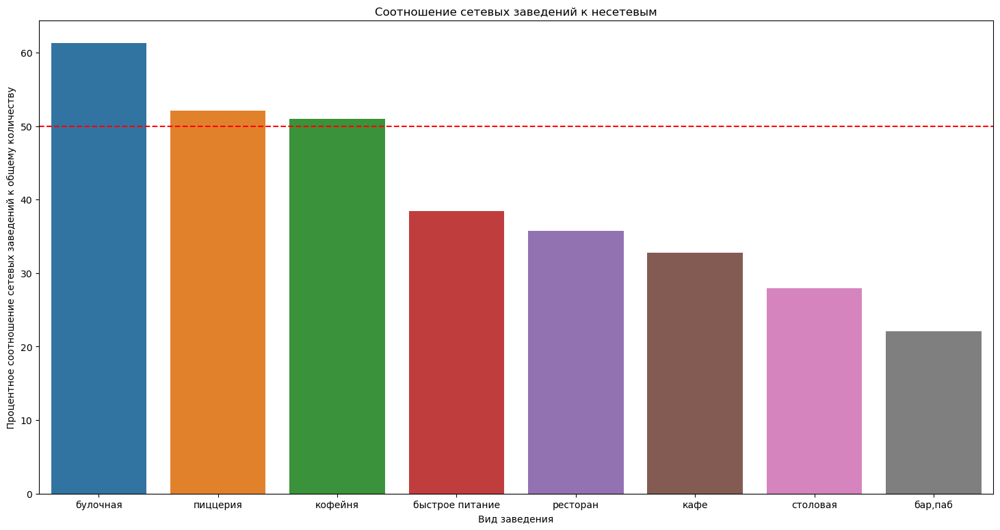

In [16]:
merge_category=chain_grouped.merge(notChain_grouped, how='inner',on='category')
merge_category=merge_category.rename(columns={'name_x':'chain','name_y':'not_chain'})
merge_category['chain_%']=merge_category['chain']/(merge_category['not_chain']+merge_category['chain'])*100
merge_category=merge_category.sort_values(by='chain_%',ascending=False)
display(merge_category)
plt.figure(figsize=(18,9))
ax=sns.barplot(y='chain_%',x='category',data=merge_category)
ax.set_xlabel('Вид заведения')
ax.set_ylabel('Процентное соотношение сетевых заведений к общему количеству')
ax.set_title('Соотношение сетевых заведений к несетевым')
plt.axhline(y = 50, color = 'r', linestyle = 'dashed')  
plt.show()

Среди несетевых объектов наибольшую долю занимают кафе - 31% и рестораны - 25%<br>
Среди сетевых объектов наибольшую долю занимают кафе - 24%, рестораны - 23% и кофейни - 22%<br>
Несмотря на то, что большинство заведений являются несетевыми, есть ряд исключений в пользу сетевых, а именно:<br>
Кофейни - сетевых заведений больше на 0,96%<br>
Пиццерии - сетевых заведений больше на 2,13%<br>
Булочные сетевых заведений больше на 11,33%<br>

### Анализ топ-15 популярных сетей в Москве

In [17]:
chain_data=data[data['chain']=='сетевое']
top_15 = chain_data.groupby('name').agg({'rating': 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.rename(columns={'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15


,name,rating,category,count
0,Шоколадница,4.20,кофейня,120
1,Домино'с Пицца,4.20,пиццерия,76
2,Додо Пицца,4.30,пиццерия,74
3,One Price Coffee,4.20,кофейня,71
4,Яндекс Лавка,4.00,ресторан,69
5,Cofix,4.10,кофейня,65
6,Prime,4.20,ресторан,50
7,Хинкальная,4.40,кафе,44
8,КОФЕПОРТ,4.20,кофейня,42
9,Кулинарная лавка братьев Караваевых,4.40,кафе,39


In [18]:
layout=go.Layout(title='Соотношение самых популярных сетей по категориям')
fig=go.Figure(data=[go.Pie(labels=top_15['category'],values=top_15['count'])],layout=layout)
fig.show()

Больше всего в топ-15 заведений категории кофейня - 40,4% или же 330

In [19]:
fig = px.bar(top_15,
             x='count',
             y='name',
             text='count',
             color='name',
             height=500,
             width=1000
             )
fig.update_layout(title = 'Топ-15 популярных сетей Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название заведений',
                  showlegend = False)
fig.show()

Самой популярной сетью является кофейня "Шоколадница" - 14,7% или же 120

### Изучение заведений по административным районам

In [20]:
#Изучим какие районы имеются в представленных данных
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [21]:
#Общее количество заведений по районам
district_count = data.groupby(['district']).agg({'name' : 'count'}).sort_values('name',ascending=False).reset_index()
district_count

,district,name
0,Центральный административный округ,2242
1,Северный административный округ,900
2,Южный административный округ,892
3,Северо-Восточный административный округ,891
4,Западный административный округ,851
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


In [22]:
district_info=data.groupby(['district','category']).agg({'rating' : 'median', 'address' : 'count'}).sort_values('address',ascending=False).reset_index().rename(columns={'address':'count'})
#Распределение категорий заведений внутри районов
district_count_category=district_info.groupby(['district','category']).agg({'count':'sum'})
pd.set_option('display.max_rows', 100)
district_count_category

count
district                                category              
Восточный административный округ        бар,паб          53   
                                        булочная         25   
                                        быстрое питание  71   
                                        кафе             272  
                                        кофейня          105  
                                        пиццерия         72   
                                        ресторан         160  
                                        столовая         40   
Западный административный округ         бар,паб          50   
                                        булочная         37   
                                        быстрое питание  62   
                                        кафе             239  
                                        кофейня          150  
                                        пиццерия         71   
                                        ресторан         218  
                                        столовая         24   
Северный административный округ         бар,паб          68   
                                        булочная         39   
                                        быстрое питание  58   
                                        кафе             235  
                                        кофейня          193  
                                        пиццерия         77   
                                        ресторан         189  
                                        столовая         41   
Северо-Восточный административный округ бар,паб          63   
                                        булочная         28   
                                        быстрое питание  82   
                                        кафе             269  
                                        кофейня          159  
                                        пиццерия         68   
                                        ресторан         182  
                                        столовая         40   
Северо-Западный административный округ  бар,паб          23   
                                        булочная         12   
                                        быстрое питание  30   
                                        кафе             115  
                                        кофейня          62   
                                        пиццерия         40   
                                        ресторан         109  
                                        столовая         18   
Центральный административный округ      бар,паб          364  
                                        булочная         50   
                                        быстрое питание  87   
                                        кафе             464  
                                        кофейня          428  
                                        пиццерия         113  
                                        ресторан         670  
                                        столовая         66   
Юго-Восточный административный округ    бар,паб          38   
                                        булочная         13   
                                        быстрое питание  67   
                                        кафе             282  
                                        кофейня          89   
                                        пиццерия         55   
                                        ресторан         145  
                                        столовая         25   
Юго-Западный административный округ     бар,паб          38   
                                        булочная         27   
                                        быстрое питание  61   
                                        кафе             238  
                                        кофейня          96   
                                        пиццерия         64   
                         

In [23]:
fig = px.bar(district_info, 
             x='count', 
             y='district',                  
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'},
                   width=1000,
                   height=700
                 )
fig.show()

Больше всего заведений в Центральном административном округе, в основном это рестораны - 670 заведений, кафе - 464 и кофейни - 428<br>
Во всех округах, за исключением Центрального, преобладающим типом заведения является Кафе, в Центральном же округе - рестораны<br>
Наиболее типичным распределением по количеству заведений по всем округам является следующее: Кафе - рестораны - кофейни. 
Бары, пабы, пиццерии, и быстрое питание имеют примерно одинаковую долю среди всег заведений, меньше всего столовых и булочных.

### Распределение средних рейтингов по категориям заведений 

In [24]:
category_rating = data.groupby('category').agg({'rating': 'mean'}).round(2).sort_values('rating', ascending=False).reset_index()
category_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [25]:
fig = px.bar(category_rating,
             x='rating',
             y='category',
             text='rating',
             color='category'
            )
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                  xaxis_title='Рейтинг',
                  yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4.5])
fig.show()

Наибольший средний ретинг у заведений категории бар,паб - 4.39, далее, с разницей в 0.01 идут пиццерии, рестораны, кофейни и булочные соответственно.

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.

In [26]:
rating_data = data.groupby('district', as_index=False)['rating'].agg('mean').round(2)
display(rating_data.sort_values(by='rating',ascending=False))
with open('E:/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаем карту Мск
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# вывод карты
m

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


Наибольший средний рейтинг заведений в Центральном административном округе - 4.38, наименьший в Юго-восточном административном округе - 4.1

### Отображение всех заведений датасета на карте с помощью кластеров

In [27]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# функция, принимающая строку датафрейма, создает маркер в текущей точке и
# добавляет его в кластер marker_cluster

def create_cluster(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
# к каждой строке датафрейма применяем функцию
data.apply(create_cluster, axis=1)

# выводим карту
m

### Выявление топ-15 улиц по количеству заведений


In [28]:
top_15_streets=data['street'].value_counts().reset_index().head(15)
top_15_streets.columns = ['street', 'count']
top_15_streets

,street,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [29]:
streets_category = data.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['street', 'category', 'count']
streets_top15_category = streets_category[streets_category['street'].isin(top_15_streets['street'])]
fig = px.bar(streets_top15_category, 
             x='count', 
             y='street',                    
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

Больше всего заведений расположено на проспекте Мира, из них преобладают кафе - 53, рестораны -45 и кофейни - 36.
В целом, такое распределение характерно для большинства популярных улиц: больше всего заведений категории кафе, рестораны и кофейни и распределены они относительно равномерно.
Явно выбивается из данного перечня МКАД, так как там большую долю всех заведений занимают кафе, а количество ресторанов и кофеен незначительно.

In [30]:
# Найдем улицы, на которых расположен только один объект общественного питания
streets_one=data['street'].value_counts().reset_index()
streets_one.columns=['street','count']
streets_one=streets_one.query('count==1')
streets_one

,street,count
990,2-я Рощинская улица,1
991,Липецкая улица (дублёр),1
992,улица Речников,1
993,Дербеневская улица,1
994,4-й Воробьёвский проезд,1
...,...,...
1443,улица Маршала Соколовского,1
1444,Малый Казённый переулок,1
1445,улица Максимова,1
1446,Басманный тупик,1


In [31]:
streets_one_category=streets_category[streets_category['street'].isin(streets_one['street'])]
streets_one_category = streets_one_category.groupby('category')['street'].count().sort_values(ascending=False).reset_index()
streets_one_category

,category,street
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


In [32]:
fig = px.bar(streets_one_category,
             x='street',
             y='category',
             text='street',
             color='category'
            )
fig.update_layout(title='Заведения, которые являются единственными на одной из улиц',
                  xaxis_title='Количество заведений',
                  yaxis_title='Название категорий')

fig.show()

Всего имеется 458 улиц, на которых расположено лишь одно заведение общественного питания, в разрезе категорий больше всего на таких улицах расположено кафе

### Исследование средних чеков заведений

Вычислим медианное значение среднего чека для каждого из районов

In [33]:
median_bill=data.groupby('district')['middle_avg_bill'].median().reset_index().sort_values('middle_avg_bill',ascending=False)
median_bill

,district,middle_avg_bill
1,Западный административный округ,"1,000.00"
5,Центральный административный округ,"1,000.00"
4,Северо-Западный административный округ,700.00
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,575.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,450.00


In [34]:
mm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=geo_json,
    data = median_bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    legend_name = 'Средний чек заведений по районам',
).add_to(mm)

mm

Самый большой средний чек в Центральном и Западном административных округах, самый маленький в Юго-восточном административном округе, при этом разница между ними более, чем в 2 раза.

## Вывод

В представленных для исследования сведениях содержится 8406 строк обозначающих заведения общественного питания.<br>
Имеются пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats, при чем пропусков большое количество, однако их удаление или заполнение средними/медианными значениями может привести к искажению данных, в виду чего решено оставить пропуски.<br>
В ходе предобработки данных осуществлены следующие действия:<br>
•	Исследовано наличие явных дубликатов, дубликаты отсутствуют<br>
•	Добавлен столбец с названием улицы отдельно от столбца с адресом<br>
•	Добавлен столбец is_24\7 для обозначения круглосуточных заведений, которые работают ежедневно.<br>
В ходе анализа установлено следующее:<br>
Наибольшую долю среди предприятий общественного питания в Москве имеют заведения типа "Кафе"- 28,3% или 2378 в количественном выражении, второе место "Ресторан" с показателем 24.3% или 2043<br>
Практически во всех заведениях, за исключением категории бар,паб в сетевых заведениях посадочных мест больше, чем в несетевых.<br>
Без разделения на сетевые/несетевые заведения больше всего посадочных мест в Ресторанах - 82, барах, пабах - 81 и в кофейнях - 80<br>
В среднем, больше всего посадочных мест в сетевых заведениях в ресторанах - 98, в кофейнях - 90 и в столовых - 80.<br>
В несетевых заведениях больше всего посадочных мест в барах, пабах - 84, ресторанах, 80 и в столовых - 64.<br>
Большинство объектов общественного питания 61,9% или же 5201 не относятся к какой-либо сети.<br>
38,1% или же 3205 объектов являются сетевыми.<br>
Среди несетевых объектов наибольшую долю занимают кафе - 31% и рестораны - 25%<br>
Среди сетевых объектов наибольшую долю занимают кафе - 24%, рестораны - 23% и кофейни - 22%<br>
Несмотря на то, что большинство заведений являются несетевыми, есть ряд исключений в пользу сетевых, а именно:<br>
Кофейни - сетевых заведений больше на 0,96%<br>
Пиццерии - сетевых заведений больше на 2,13%<br>
Булочные сетевых заведений больше на 11,33%<br>
Больше всего в топ-15 сетевых заведений - категории кофейня - 40,4% или же 330
Самой популярной сетью является кофейня "Шоколадница" - 14,7% или же 120 от общего количества.<br>
Больше всего заведений в Центральном административном округе, в основном это рестораны - 670 заведений, кафе - 464 и кофейни - 428<br>
Во всех округах, за исключением Центрального, преобладающим типом заведения является Кафе, в Центральном же округе - рестораны<br>
Наиболее типичным распределением по количеству заведений по всем округам является следующее: Кафе - рестораны - кофейни. 
Бары, пабы, пиццерии, и быстрое питание имеют примерно одинаковую долю среди всег заведений, меньше всего столовых и булочных.
Наибольший средний ретинг у заведений категории бар,паб - 4.39, далее, с разницей в 0.01 идут пиццерии, рестораны, кофейни и булочные соответственно.<br>
Наибольший средний рейтинг заведений в Центральном административном округе - 4.38, наименьший в Юго-восточном административном округе - 4.1<br>
Больше всего заведений расположено на проспекте Мира, из них преобладают кафе - 53, рестораны -45 и кофейни - 36.
В целом, такое распределение характерно для большинства популярных улиц: больше всего заведений категории кафе, рестораны и кофейни и распределены они относительно равномерно.
Явно выбивается из данного перечня МКАД, так как там большую долю всех заведений занимают кафе, а количество ресторанов и кофеен незначительно.
Всего имеется 458 улиц, на которых расположено лишь одно заведение общественного питания, в разрезе категорий больше всего на таких улицах расположено кафе<br>
Самый большой средний чек (1000) в Центральном и Западном административных округах, самый маленький в Юго-восточном административном округе (450), при этом разница между ними более, чем в 2 раза.<br>


## Детализация исследования: открытие кофейни

In [35]:
coffee=data[data['category']=='кофейня']
print('Количество кофеен:',len(coffee))

Количество кофеен: 1413


In [36]:
# создаем карту
mmm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(mmm)

# функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# выводим карту
mmm

Всего в Москве 1413 заведение типа "кофейня", больше всего кофеен расположено в центральной части города.

In [37]:
coffee_24_7=coffee[coffee['is_24/7']==True]
print('Количество круглосуточных кофеен',len(coffee_24_7))


Количество круглосуточных кофеен 59


In [38]:
# создаём карту Москвы
mmmm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(mmmm)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_24_7.apply(create_clusters, axis=1)

# выводим карту
mmmm

Всего в Москве присутствует 59 круглосуточных кофеен, при этом большинство из них расположено в центральной части города.

In [39]:
#Исследуем рейтинг кофеен в разрезе округов
coffee_rating = coffee.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [40]:
mmmmm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Средний рейтинг заведений по районам',
).add_to(mmmmm)

# выводим карту
mmmmm

Самый высокий рейтинг кофеен в Центральном (4,34) и Северо-западном (4.33) административных округах, самый низкий рейтинг в Западном административном округе (4.20)

In [41]:
#Исследуем среднюю цену на чашку кофе
cup_of_coffee = coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(cup_of_coffee)
coffee_price = round(cup_of_coffee['middle_coffee_cup'].mean(), 2)
print(f'Средняя стоимость чашки кофе в Москве:', coffee_price)

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


Средняя стоимость чашки кофе в Москве: 171.32


In [42]:
mmmmmm=Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=cup_of_coffee,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    legend_name='Средняя цена чашки кофе по районам',
).add_to(mmmmmm)

mmmmmm

Самая высокая стоимость чашки кофе в Западном(189,94 руб.) и Центральном административных округах(187,52 руб.), самая низкая в Юго-Восточном административном округе. При этом средняя стоимость чашки кофе составляет 171,32 руб.

## Рекомендации по открытию кофейни в г. Москва

Основываясь на полученных в результате исследования данных, при открытии кофейни следует рассматривать Центральный, Западный и Юго-западный административные округа, так как в этих районах высокая средняя стоимость чашки кофе и при начале работы можно завладеть клиентской базой за счет демпинга, при этом не понеся значительных финансовых потерь. При этом, в случае открытия кофейни в Центральном административном округе необходимо обратить внимание на возможность круглосуточной работы, так как центральная часть города является самой оживленной в ночное время и количество круглосуточных кофеен незначительное.<br>
Западный административный округ привлекателен для открытия тем, что в нем самый низкий средний рейтинг у кофеин, что свидетельствует о проблемности заведений в данном округе и, в случае октрытия заведения надлежащего качества, данный факт может стать конкурентным преимуществом. <br>



Презентация : https://disk.yandex.ru/i/4PUf3zsSxr-Acw